# 네트워크 분석

네트워크 분석(Network Analysis)은 지리적 공간 내의 네트워크, 즉 도로, 철도, 강, 전력선 등의 연결과 흐름을 분석하는 방법입니다. 이를 통해 최적 경로 찾기, 서비스 영역 분석, 네트워크의 효율성 평가 등 다양한 공간 문제를 해결할 수 있습니다. <br><br>

네트워크 분석을 위한 네트워크는 노드와 엣지로 구성이 됩니다. 노드는 엣지가 만나는 지점을 의미하고, 엣지는 도로를 의미합니다. <br><br>
![](https://upload.wikimedia.org/wikipedia/commons/2/2f/Small_Network.png)

본 문서에서는 아래의 5가지 패키지를 사용합니다. <br><br>
`tqdm`는 코드의 Iternation과 같은 상황에서 진행상황을 보여주는 패키지.  <br>
`math`는 수학적 계산을 위한 패키지.<br>
`networkx`는 네트워크 분석을 위한 패키지.<br>
`osmnx`는 OpenStreetMap 데이터를 가져오는 패키지.<br>
`matplotlib`는 그래프를 그리기 위한 패키지.<br>

In [264]:
import requests
import json
import geopandas as gpd
import pandas as pd

from tqdm import tqdm
import math
import networkx as nx
import osmnx as ox
import matplotlib.pyplot as plt

# 1. 분석 데이터 준비
## 1.1. 카카오 API를 활용하여 상급병원 데이터 지오코딩

Source: HIRA 건강지도 (상급 종합병원 위치) <br>
https://www.hira.or.kr/ra/hosp/getHealthMap.do?


In [2]:
# 판다스를 활용하여 엑셀 파일 불러오기
hospitals_df = pd.read_excel('data/hospitals.xlsx')
hospitals_df

,병원명,병원/약국구분,전화번호,우편번호,소재지주소,홈페이지
0,연세대학교의과대학세브란스병원,상급종합,02-2228-0114,3722,"서울특별시 서대문구 연세로 50-1, (신촌동)",http://www.yuhs.or.kr
1,강북삼성병원,상급종합,02-2001-2001,3181,"서울특별시 종로구 새문안로 29, (평동)",http://www.kbsmc.co.kr
2,이화여자대학교의과대학부속목동병원,상급종합,02-2650-5114,7985,"서울특별시 양천구 안양천로 1071, (목동)",http://www.eumc.ac.kr/mokdong/
3,중앙대학교병원,상급종합,1800-1114,6973,"서울특별시 동작구 흑석로 102, (흑석동)",http://ch.cauhs.or.kr/
4,서울대학교병원,상급종합,1588-5700,3080,"서울특별시 종로구 대학로 101, (연건동)",http://www.snuh.org
5,학교법인가톨릭학원가톨릭대학교서울성모병원,상급종합,02-1588-1511,6591,"서울특별시 서초구 반포대로 222, (반포동)",http://www.cmcseoul.or.kr/
6,학교법인 고려중앙학원 고려대학교의과대학부속병원(안암병원),상급종합,1577-0083,2841,"서울특별시 성북구 고려대로 73, 고려대병원 (안암동5가)",http://anam.kumc.or.kr/main/index.do
7,고려대학교의과대학부속구로병원,상급종합,02-2626-1114,8308,"서울특별시 구로구 구로동로 148, 고려대부속구로병원 (구로동)",http://guro.kumc.or.kr/main/index.do
8,한양대학교병원,상급종합,02-2290-8114,4763,"서울특별시 성동구 왕십리로 222-1, (사근동)",http://seoul.hyumc.com
9,경희대학교병원,상급종합,02-958-8114,2447,"서울특별시 동대문구 경희대로 23, (회기동)",http://www.khuh.or.kr/


In [3]:
# API를 쉽게 활용하기 위하여, 지오코딩을 아래와 같이 함수로 만들 수 있음. 

def geocoding_KakaoAPI(query_txt, API_KEY):
    url = 'https://dapi.kakao.com/v2/local/search/address.json'
    
    headers = {'Authorization': f'KakaoAK {API_KEY}'} 
    params = {'query': query_txt}

    response = requests.get(url, headers=headers, params=params)

    if response.status_code == 200:
        lat, lon = response.json()['documents'][0]['y'], response.json()['documents'][0]['x']
        return lat, lon
    else:
        print('Error:', response.status_code)
        return None, None

# Kakao API 키를 입력
REST_API_KEY = "10a11b38e517203e094d147dae1789e0" # Kakao REST API 키

# 상급병원 데이터 프레임 (hospitals)를 각 열에 대하여 반복문을 실행하며, 
# 각 병원의 주소를 이용하여 위도와 경도를 찾아냄
for idx, row in tqdm(hospitals_df.iterrows(), total=hospitals_df.shape[0]):
    lat, lon = geocoding_KakaoAPI(row['소재지주소'], REST_API_KEY)
    hospitals_df.loc[idx, 'lat'] = lat
    hospitals_df.loc[idx, 'lon'] = lon

hospitals_df

100%|██████████| 14/14 [00:00<00:00, 15.71it/s]


,병원명,병원/약국구분,전화번호,우편번호,소재지주소,홈페이지,lat,lon
0,연세대학교의과대학세브란스병원,상급종합,02-2228-0114,3722,"서울특별시 서대문구 연세로 50-1, (신촌동)",http://www.yuhs.or.kr,37.563674036531,126.941917689273
1,강북삼성병원,상급종합,02-2001-2001,3181,"서울특별시 종로구 새문안로 29, (평동)",http://www.kbsmc.co.kr,37.5688677261045,126.967812703696
2,이화여자대학교의과대학부속목동병원,상급종합,02-2650-5114,7985,"서울특별시 양천구 안양천로 1071, (목동)",http://www.eumc.ac.kr/mokdong/,37.5369818505985,126.886743916495
3,중앙대학교병원,상급종합,1800-1114,6973,"서울특별시 동작구 흑석로 102, (흑석동)",http://ch.cauhs.or.kr/,37.506038005044,126.960421779226
4,서울대학교병원,상급종합,1588-5700,3080,"서울특별시 종로구 대학로 101, (연건동)",http://www.snuh.org,37.5804523853297,126.997196437908
5,학교법인가톨릭학원가톨릭대학교서울성모병원,상급종합,02-1588-1511,6591,"서울특별시 서초구 반포대로 222, (반포동)",http://www.cmcseoul.or.kr/,37.5023936158073,127.005860604348
6,학교법인 고려중앙학원 고려대학교의과대학부속병원(안암병원),상급종합,1577-0083,2841,"서울특별시 성북구 고려대로 73, 고려대병원 (안암동5가)",http://anam.kumc.or.kr/main/index.do,37.5873771473625,127.026248862202
7,고려대학교의과대학부속구로병원,상급종합,02-2626-1114,8308,"서울특별시 구로구 구로동로 148, 고려대부속구로병원 (구로동)",http://guro.kumc.or.kr/main/index.do,37.4911503253664,126.884511034177
8,한양대학교병원,상급종합,02-2290-8114,4763,"서울특별시 성동구 왕십리로 222-1, (사근동)",http://seoul.hyumc.com,37.5585815432773,127.045715688792
9,경희대학교병원,상급종합,02-958-8114,2447,"서울특별시 동대문구 경희대로 23, (회기동)",http://www.khuh.or.kr/,37.5937762050989,127.050741696591


### *Exercise*

아래의 코드를 활용하여, 카카오 API에서 지오코딩 된 (주소 -> 경위도) 데이터를 Geometry를 생성하고, GeoDataFrame으로 생성하세요 (좌표계의 EPSG 코드는 4326 입니다). 

```python
# 지오데이터프레임 변환
hospitals_4326 = gpd.GeoDataFrame(data=`데이터 프레임 변수`, 
                           geometry=gpd.points_from_xy(`데이터 프레임의 경도 Column, 데이터 프레임의 위도 Column`), # ArcGIS의 XY Table to Point와 유사한 역할
                           crs=`EPSG:EPSG 코드` # 좌표계 설정 (WGS84)
                           ) 
```
<br>
참고: https://geopandas.org/en/stable/docs/reference/api/geopandas.points_from_xy.html

In [ ]:
# Your code here
hospitals_4326 = gpd.GeoDataFrame(data=`데이터 프레임 변수`, 
                                  geometry=gpd.points_from_xy(`데이터 프레임의 경도 Column, 데이터 프레임의 위도 Column`), # ArcGIS의 XY Table to Point와 유사한 역할
                                  crs=`EPSG:EPSG 코드` # 좌표계 설정 (WGS84)
                                ) 

# 동적 지도 시각화
hospitals_4326.explore()

In [ ]:
# 정답 확인
# 아래의 코드가 정상적으로 작동하면, Success가 출력됨
assert type(hospitals_4326) == gpd.GeoDataFrame
assert hospitals_4326.loc[0, 'geometry'].wkt == 'POINT (126.941917689273 37.563674036531)'

print('Success')

In [4]:
# # 검색된 위도와 경도를 이용하여, GeoDataFrame을 생성 + 좌표계를 EPSG:4326으로 설정
# hospitals_4326 = gpd.GeoDataFrame(hospitals_df, 
#                                   geometry=gpd.points_from_xy(hospitals_df.lon, hospitals_df.lat), 
#                                   crs='EPSG:4326')
# hospitals_4326

,병원명,병원/약국구분,전화번호,우편번호,소재지주소,홈페이지,lat,lon,geometry
0,연세대학교의과대학세브란스병원,상급종합,02-2228-0114,3722,"서울특별시 서대문구 연세로 50-1, (신촌동)",http://www.yuhs.or.kr,37.563674036531,126.941917689273,POINT (126.94192 37.56367)
1,강북삼성병원,상급종합,02-2001-2001,3181,"서울특별시 종로구 새문안로 29, (평동)",http://www.kbsmc.co.kr,37.5688677261045,126.967812703696,POINT (126.96781 37.56887)
2,이화여자대학교의과대학부속목동병원,상급종합,02-2650-5114,7985,"서울특별시 양천구 안양천로 1071, (목동)",http://www.eumc.ac.kr/mokdong/,37.5369818505985,126.886743916495,POINT (126.88674 37.53698)
3,중앙대학교병원,상급종합,1800-1114,6973,"서울특별시 동작구 흑석로 102, (흑석동)",http://ch.cauhs.or.kr/,37.506038005044,126.960421779226,POINT (126.96042 37.50604)
4,서울대학교병원,상급종합,1588-5700,3080,"서울특별시 종로구 대학로 101, (연건동)",http://www.snuh.org,37.5804523853297,126.997196437908,POINT (126.99720 37.58045)
5,학교법인가톨릭학원가톨릭대학교서울성모병원,상급종합,02-1588-1511,6591,"서울특별시 서초구 반포대로 222, (반포동)",http://www.cmcseoul.or.kr/,37.5023936158073,127.005860604348,POINT (127.00586 37.50239)
6,학교법인 고려중앙학원 고려대학교의과대학부속병원(안암병원),상급종합,1577-0083,2841,"서울특별시 성북구 고려대로 73, 고려대병원 (안암동5가)",http://anam.kumc.or.kr/main/index.do,37.5873771473625,127.026248862202,POINT (127.02625 37.58738)
7,고려대학교의과대학부속구로병원,상급종합,02-2626-1114,8308,"서울특별시 구로구 구로동로 148, 고려대부속구로병원 (구로동)",http://guro.kumc.or.kr/main/index.do,37.4911503253664,126.884511034177,POINT (126.88451 37.49115)
8,한양대학교병원,상급종합,02-2290-8114,4763,"서울특별시 성동구 왕십리로 222-1, (사근동)",http://seoul.hyumc.com,37.5585815432773,127.045715688792,POINT (127.04572 37.55858)
9,경희대학교병원,상급종합,02-958-8114,2447,"서울특별시 동대문구 경희대로 23, (회기동)",http://www.khuh.or.kr/,37.5937762050989,127.050741696591,POINT (127.05074 37.59378)


## 1.2. 읍면동(행정동) 경계 데이터 불러오기

Source: https://www.vworld.kr/dtmk/dtmk_ntads_s002.do?dsId=30017

In [5]:
# 읍면동 데이터 불러오기
emd = gpd.read_file('data/emd_5179.geojson')
emd.head(3)

,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,사직동,11010530,"POLYGON ((953553.932 1953335.741, 953555.211 1..."
1,20230701,삼청동,11010540,"POLYGON ((954025.242 1953916.389, 954026.972 1..."
2,20230701,부암동,11010550,"POLYGON ((952490.380 1956548.821, 952497.594 1..."


In [6]:
# 동적 지도 시각화
emd.explore()

<Axes: >

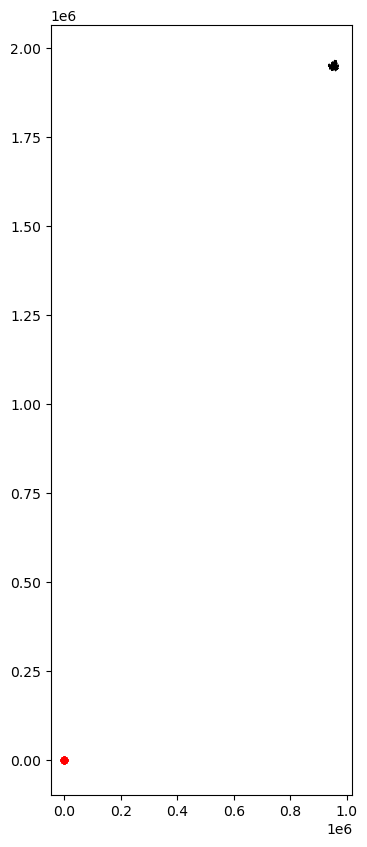

In [7]:
# Matplotlib을 이용하여 병원 위치 및 읍면동 경계 시각화
# 두 데이터의 좌표계가 다르기 떄문에, 다른 위치에 나타남. 

# 시각화를 할 캔버스를 생성
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# 읍면동 경계를 시각화
emd.boundary.plot(ax=ax, color='black', linewidth=0.5, zorder=1)

# 병원 위치를 시각화
hospitals_4326.plot(ax=ax, color='red', markersize=20, zorder=2)

In [8]:
# to_crs 매서드를 활용하여, 좌표계를 WGS 84에서 UTM-K로 변경 
hospitals_5179 = hospitals_4326.to_crs(epsg=5179)
hospitals_5179.head(3)

,병원명,병원/약국구분,전화번호,우편번호,소재지주소,홈페이지,lat,lon,geometry
0,연세대학교의과대학세브란스병원,상급종합,02-2228-0114,3722,"서울특별시 서대문구 연세로 50-1, (신촌동)",http://www.yuhs.or.kr,37.563674036531,126.941917689273,POINT (950712.779 1951736.866)
1,강북삼성병원,상급종합,02-2001-2001,3181,"서울특별시 종로구 새문안로 29, (평동)",http://www.kbsmc.co.kr,37.5688677261045,126.967812703696,POINT (953002.986 1952299.815)
2,이화여자대학교의과대학부속목동병원,상급종합,02-2650-5114,7985,"서울특별시 양천구 안양천로 1071, (목동)",http://www.eumc.ac.kr/mokdong/,37.5369818505985,126.886743916495,POINT (945820.725 1948805.861)


<Axes: >

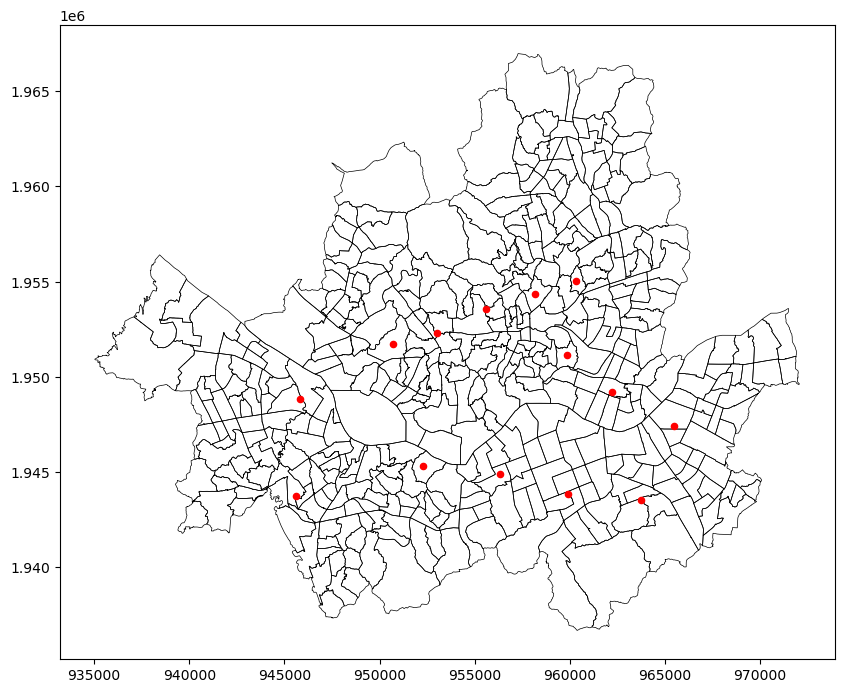

In [9]:
# Matplotlib을 이용하여 병원 위치 및 읍면동 경계 시각화
# 두 데이터의 좌표계를 맞췄기 떄문에, 같은 위치에 잘 표시가 됨. 

# 시각화를 할 캔버스를 생성
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# 읍면동 경계를 시각화
emd.boundary.plot(ax=ax, color='black', linewidth=0.5, zorder=1)

# 병원 위치를 시각화
hospitals_5179.plot(ax=ax, color='red', markersize=20, zorder=2)

## 1.3. 거리계산을 위하여 행정동 폴리곤을 포인트로 변환

In [10]:
# 복사본 생성
emd_pnt = emd.copy()

# 중심점을 계산하여 geometry에 할당
emd_pnt['geometry'] = emd.centroid

emd_pnt.head(3)

,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,사직동,11010530,POINT (953232.514 1952855.551)
1,20230701,삼청동,11010540,POINT (954197.713 1954457.198)
2,20230701,부암동,11010550,POINT (952643.871 1955418.736)


<Axes: >

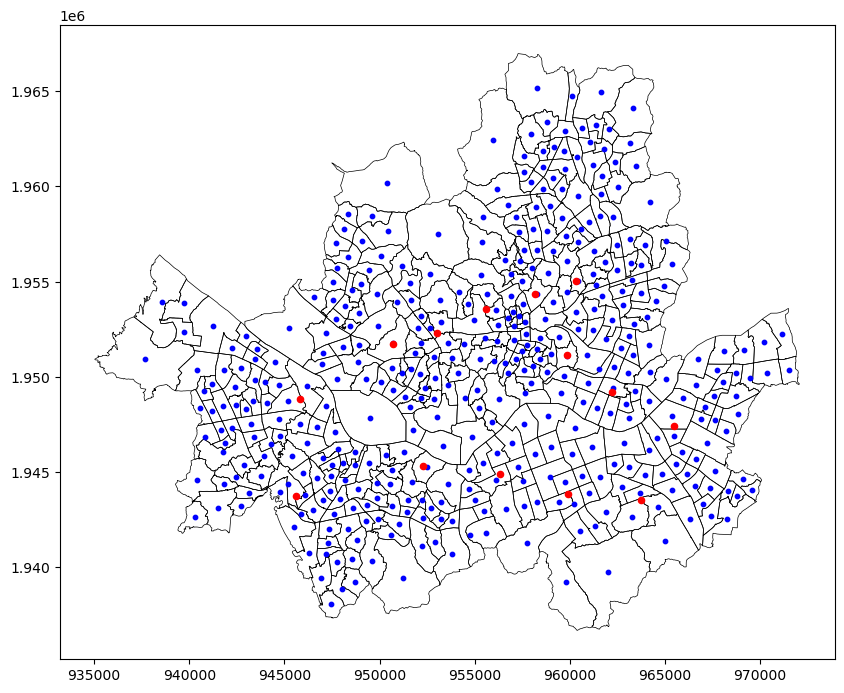

In [11]:
# Matplotlib을 이용하여 병원 위치, 읍면동 경계 및 중심점 시각화

# 시각화를 할 캔버스를 생성
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# 읍면동 경계를 시각화
emd.boundary.plot(ax=ax, color='black', linewidth=0.5, zorder=1)

# 읍면동 중심점을 시각화
emd_pnt.plot(ax=ax, color='blue', markersize=10, zorder=2)

# 병원 위치를 시각화
hospitals_5179.plot(ax=ax, color='red', markersize=20, zorder=3)

# 2. 두 지점 사이의 거리/경로 계산

* 유클리디안 거리: 두 점 사이의 직선 거리를 계산하는 방법
$$
d\ = \sqrt{(x_2 - x_1)^2 + (y_2 - y_1)^2} \
$$

* 맨하탄 거리 (최단거리 경로): (도로) 네트워크 상에서의 최단 거리 (통행속도 고려 X) <br><br>
* 최단 시간 경로: 실제 도로 네트워크 상에서 이동 시간을 고려하여 계산한 경로


## 2.1. 두 지점(회기동, 삼성서울병원)을 각각 GeoDataFrame으로 추출

In [14]:
# 회기동
회기동 = emd_pnt.loc[emd_pnt['ADM_NM'] == '회기동'].reset_index(drop=True)
회기동

,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,회기동,11060710,POINT (960407.565 1955018.143)


In [13]:
# 서울삼성병원
삼성서울병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '삼성서울병원'].reset_index(drop=True)
삼성서울병원

,병원명,병원/약국구분,전화번호,우편번호,소재지주소,홈페이지,lat,lon,geometry
0,삼성서울병원,상급종합,02-3410-2114,6351,"서울특별시 강남구 일원로 81, (일원동, 삼성의료원)",http://www.samsunghospital.com,37.49034450782,127.089590154403,POINT (963719.092 1943534.203)


## 2.2. 삼성서울병원과 회기동 사이의 유클리디안 거리 계산

In [15]:
# 유클리디안 거리 계산
math.sqrt((삼성서울병원.geometry.x - 회기동.geometry.x)**2 
          + (삼성서울병원.geometry.y - 회기동.geometry.y)**2
          )

/var/folders/pz/gjtw38596y3_mm15469h9jy40000gn/T/ipykernel_34686/4204333552.py:2: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  math.sqrt((삼성서울병원.geometry.x - 회기동.geometry.x)**2


11951.865407078272

In [16]:
# 다른 방식의 유클리디안 거리 계산 방법
# 단, 각 변수가 GeoDataFrame 또는 GeoSeries의 형태를 하고 있어야 함. 
회기동.distance(삼성서울병원).values[0]

11951.865407078272

---
### *Exercise*

아래의 코드를 활용하여, 경희대학교병원과 여의동 사이의 유클리디안 거리를 계산하고, 결과 값을 `euc_dist`에 할당하시오.

```python
# 세부 단계
# 1. `emd_pnt`에서 여의동 행만 추출하여 `여의동` 변수에 할당 (GeoDataFrame.loc 활용, GeoDataFrame 할당)
여의동 = 
# 2. `hospitals_5179`에서 경희대학교병원 행만 추출하여 `경희대학교병원` 변수에 할당 (GeoDataFrame.loc 활용, GeoDataFrame 할당)
경희대학교병원 = 
# 3. `경희대학교병원`과 `여의동` 사이의 유클리디안 거리를 계산하여 `euc_dist` 변수에 할당 (GeoDataFrame.distance 활용, 숫자만 할당)
euc_dist =  
```
---

In [ ]:
# Your code here

# 세부 단계
# 1. `emd_pnt`에서 여의동 행만 추출하여 `여의동` 변수에 할당 (GeoDataFrame.loc 활용, GeoDataFrame 할당)
여의동 = 
# 2. `hospitals_5179`에서 경희대학교병원 행만 추출하여 `경희대학교병원` 변수에 할당 (GeoDataFrame.loc 활용, GeoDataFrame 할당)
경희대학교병원 = 
# 3. `경희대학교병원`과 `여의동` 사이의 유클리디안 거리를 계산하여 `euc_dist` 변수에 할당 (GeoDataFrame.distance 활용, 숫자만 할당)
euc_dist =  

In [114]:
# 정답 확인
# 아래의 코드가 정상적으로 작동하면, Success가 출력됨
assert 여의동['geometry'].values[0].wkt == 'POINT (949501.5627887434 1947842.2642170596)'
assert 경희대학교병원['geometry'].values[0].wkt == 'POINT (960339.6342706934 1955025.0432906193)'
assert round(euc_dist) == 13002

print('Success')

Success


In [112]:
# 여의동 = emd_pnt.loc[emd_pnt['ADM_NM'] == '여의동'].reset_index(drop=True)
# 경희대학교병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '경희대학교병원'].reset_index(drop=True)
# euc_dist = 여의동.distance(경희대학교병원).values[0]

## 2.3. 회기동에서 삼성서울병원 까지의 맨하탄 거리 계산

View-T 에서 제공하는 도로네트워크를 사용하여 맨하탄 거리 계산. <br>
실제 데이터는 .gpkg 파일 또는 .shp 파일로 제공되지만, 본 예제에서는 .graphml로 변환된 파일을 사용

세부 단계:
* 도로 네트워크 불러오기
* (네트워크 분석은 각 노드 사이의 거리 만을 계산할 수 있으므로) 서울삼성병원 및 회기동에서 가장 가까운 노드 찾기
* 두 노드 사이의 맨하탄 거리 계산

Source: https://viewt.ktdb.go.kr/cong/map/page.do

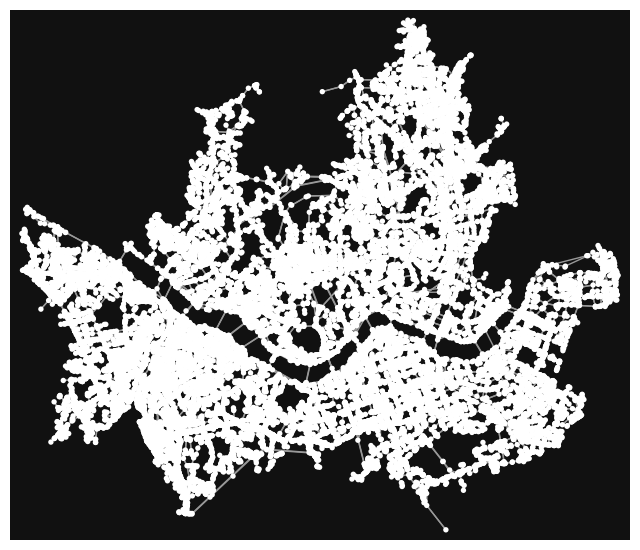

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [78]:
# 서울 도로네트워크 데이터 불러오기
G = ox.load_graphml(filepath='./data/road_network_5179.graphml', # 파일 경로
                    edge_dtypes={'length_meter': float, 
                                 'max_speed': int,
                                 'road_rank': str
                                 } # 불러올 속성의 데이터 타입을 지정
                    )
ox.plot_graph(G) # 도로네트워크 시각화

In [52]:
type(G)

networkx.classes.multidigraph.MultiDiGraph

In [24]:
# ox.graph_to_gdfs 함수를 활용하여, 도로네트워크 데이터를 GeoDataFrame으로 변환
# 실제 분석에는 추출할 필요 없으나, 본 노트북에서는 시각화를 위하여 추출
nodes, edges = ox.graph_to_gdfs(G, nodes=True, edges=True)
nodes.head(3)

,node_type,y,x,lon,lat,geometry
osmid,,,,,,
226853,101,1.952330e+06,954147.490376,126.980771,37.569195,POINT (954147.490 1952329.743)
223385,101,1.952336e+06,954070.458685,126.979898,37.569251,POINT (954070.459 1952336.369)
849319,101,1.945538e+06,961569.938707,127.065175,37.508318,POINT (961569.939 1945537.889)


In [25]:
edges.head(3)

osmid max_speed road_name road_rank link_type  \
u      v      key                                                        
226853 223385 0    47874115801        50      청계천로       104         1   
223385 814026 0    47874115401         0        종로       104     32768   
       221672 0    47871384201        50      청계천로       104         1   

                   length_meter  \
u      v      key                 
226853 223385 0       77.316115   
223385 814026 0       37.694827   
       221672 0       53.179899   

                                                            geometry  
u      v      key                                                     
226853 223385 0    LINESTRING (954147.490 1952329.743, 954070.459...  
223385 814026 0    LINESTRING (954070.459 1952336.369, 954071.421...  
       221672 0    LINESTRING (954070.459 1952336.369, 954017.455...

In [26]:
# 도로네트워크 (그래프) 또한 좌표계를 가지며, 이를 확인하기 위하여 아래와 같이 코드를 실행
# 만약 좌표계가 없거나 잘못 설정되어 있다면, 아래의 최근린 노드 찾기가 정상적으로 작동하지 않음
G.graph['crs']

'EPSG:5179'

아래의 코드를 활용하여 최근린 노드를 검색할 수 있음. 

Syntax: 
```python
nearest_node = ox.distance.nearest_nodes(`NETWORK`, `POINT LONGITUDE`, `POINT LATITUDE`)
```

Source: https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.distance.nearest_nodes

In [27]:
# 입력 값이 GeoDataFrame인 경우, 결과 값이 리스트의 형태로 반환됨. 
# 여러 값이 반환되는 이유는 입력 변수가 여러 개일 수 있기 때문임. 
삼성서울병원_node = ox.distance.nearest_nodes(G, 삼성서울병원.geometry.x, 삼성서울병원.geometry.y)
삼성서울병원_node

[847578]

In [28]:
# 리스트 슬라이스를 통하여, 원하는 노드 ID를 추출 할 수 있음. 
삼성서울병원_node[0]

847578

In [29]:
# 실제로 모든 병원을 입력하였을 때는 다음과 같이 리턴 값이 리스트로 도출됨. 
ox.distance.nearest_nodes(G, hospitals_5179.geometry.x, hospitals_5179.geometry.y)

[637022,
 223953,
 224111,
 225305,
 224912,
 646050,
 347738,
 219336,
 343880,
 647525,
 339114,
 646811,
 847578,
 343332]

In [30]:
# 리턴 값이 리스트로 도출 되는 것이 싫다면, 아래와 같이 숫자만을 입력 변수로 넣어주면 됨.
ox.distance.nearest_nodes(G, 삼성서울병원.geometry.values[0].x, 삼성서울병원.geometry.values[0].y)

847578

In [31]:
회기동_node = ox.distance.nearest_nodes(G, 회기동.geometry.x, 회기동.geometry.y)
회기동_node

[347649]

아래의 코드를 활용하여, 두 지점 사이의 맨하탄 거리를 구할 수 있음. 

Syntax: 
```python
nx.shortest_path_length(G=`NETWORK`, 
                        source=`NEAREST NODE OF ORIGIN`, 
                        target=`NEAREST NODE OF DESTINATION`, 
                        weight=`가중치를 줄 항목`)
```

Source: https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.shortest_paths.generic.shortest_path_length.html

In [117]:
nx.shortest_path_length(G, 347649, 847578, weight='length_meter')

15487.289479829038

In [118]:
# 노드 ID의 숫자 입력 대신, 변수로 할당된 것을 입력하여 최단 경로를 계산할 수도 있음. 
nx.shortest_path_length(G, 회기동_node[0],삼성서울병원_node[0],  weight='length_meter')

15487.289479829038

In [120]:
# 유클리디안 거리와 비교
회기동.distance(삼성서울병원).values[0]

11951.865407078272

In [121]:
# nx.shortest_path 함수를 활용하여, 최단 경로를 계산할 수도 있음. 
# 단, 이 함수는 경로상에 위치한 노드를 반환함.
routes = nx.shortest_path(G, 회기동_node[0],삼성서울병원_node[0], weight='length_meter')
routes

[347649,
 345501,
 563330,
 345500,
 347057,
 346866,
 346867,
 345558,
 345555,
 345493,
 345492,
 345495,
 346692,
 347754,
 343920,
 343254,
 342061,
 343253,
 343463,
 343464,
 340839,
 343795,
 646364,
 342321,
 646365,
 563081,
 340880,
 343462,
 341932,
 340890,
 563107,
 342782,
 340877,
 646316,
 342866,
 342326,
 340863,
 340861,
 646992,
 341988,
 340831,
 343731,
 343280,
 343281,
 343279,
 343191,
 341048,
 341046,
 342312,
 342440,
 341023,
 341031,
 341027,
 341026,
 342441,
 344596,
 341012,
 344763,
 341010,
 341928,
 341030,
 341017,
 343981,
 341014,
 340681,
 342785,
 341032,
 342439,
 342881,
 646793,
 646632,
 343384,
 646687,
 344524,
 344525,
 344523,
 344526,
 340574,
 342449,
 614002,
 341278,
 341280,
 341281,
 341282,
 341276,
 613876,
 343231,
 344625,
 341231,
 341885,
 341225,
 341226,
 341224,
 343966,
 343967,
 343975,
 343976,
 340608,
 342045,
 343077,
 338899,
 847932,
 847938,
 340168,
 338300,
 562893,
 338297,
 645982,
 339213,
 747727,
 847413,
 

In [122]:
# 시각화를 위하여 노드가 연결되어 있는 도로 데이터 (엣지)를 추출
od_list = [[routes[i], routes[i+1]] for i in range(len(routes)-1)]

ori_dest = [list(x) for x in zip(*od_list)]
routes_gdf = gpd.GeoDataFrame(data={'origin': ori_dest[0], 'dest': ori_dest[1]}, geometry=[edges.loc[(u, v)].geometry.iloc[0] for u, v in od_list], crs=edges.crs)
routes_gdf.head(3)

/var/folders/pz/gjtw38596y3_mm15469h9jy40000gn/T/ipykernel_34686/1886118951.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  routes_gdf = gpd.GeoDataFrame(data={'origin': ori_dest[0], 'dest': ori_dest[1]}, geometry=[edges.loc[(u, v)].geometry.iloc[0] for u, v in od_list], crs=edges.crs)


,origin,dest,geometry
0,347649,345501,"LINESTRING (960510.889 1955032.770, 960512.291..."
1,345501,563330,"LINESTRING (960512.291 1955004.100, 960496.930..."
2,563330,345500,"LINESTRING (960496.930 1954896.620, 960475.643..."


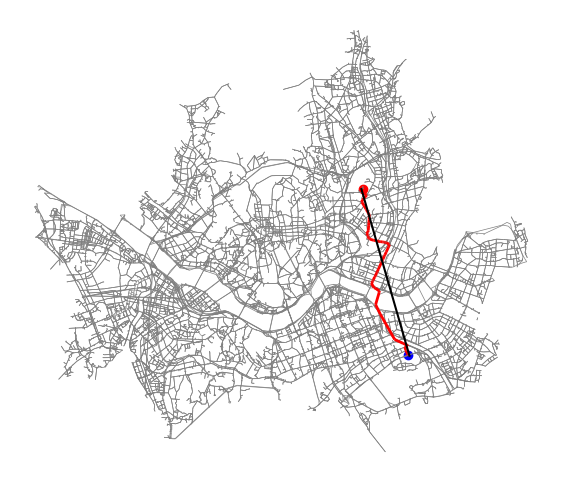

In [125]:
# 유클리디안 거리와 맨하탄 거리 비교

# 캔버스 생성
fig, ax = plt.subplots(figsize=(7,7))

# 회기동 중심점 노드
nodes.loc[nodes.index == 회기동_node[0]].plot(ax=ax, color='red')  # Snapping point

# 삼성서울병원 노드
nodes.loc[nodes.index == 삼성서울병원_node[0]].plot(ax=ax, color='blue')  # Snapping point

# Plot the road network
edges.plot(ax=ax, color='grey', linewidth=0.5)
routes_gdf.plot(ax=ax, color='red', linewidth=2) # 최단 거리 경로

# Euclidean distance
ax.plot([삼성서울병원.geometry.x, 회기동.geometry.x], [삼성서울병원.geometry.y, 회기동.geometry.y], color='black')
ax.set_axis_off()

plt.show()

정리된 코드는 아래와 같음.

```python
# 서울 도로네트워크 데이터 불러오기
G = ox.load_graphml(filepath=`graphml 파일경로`, # 파일경로
                    edge_dtypes={`Column 명`: `데이터타입`} # 불러올 속성의 데이터 타입을 지정
                    )

# 주어진 지점에서 가장 가까운 노드 찾기
`최근린노드1` = ox.distance.nearest_nodes(`NETWORK`, `POINT LONGITUDE`, `POINT LATITUDE`)
`최근린노드2` = ox.distance.nearest_nodes(`NETWORK`, `POINT LONGITUDE`, `POINT LATITUDE`)

# 최단 경로 계산
`맨하탄거리` = nx.shortest_path_length(G=`NETWORK`, 
                                    source=`NEAREST NODE OF ORIGIN`, 
                                    target=`NEAREST NODE OF DESTINATION`, 
                                    weight=`가중치를 줄 항목`)
```

---
### *Exercise*

아래의 코드를 활용하여, 여의동에서 경희대학교병원까지의 맨하탄 거리를 계산하고, 결과 값을 `man_dist`에 할당하시오.

```python
# 세부 단계
# 0. 맨하탄 거리를 계산할 지점 불러오기
# 여의동 = emd_pnt.loc[emd_pnt['ADM_NM'] == '여의동'].reset_index(drop=True)
# 경희대학교병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '경희대학교병원'].reset_index(drop=True)

# # 1. 서울 도로네트워크 데이터 불러오기
# G = ox.load_graphml(filepath='./data/road_network_5179.graphml', # 파일 경로
#                     edge_dtypes={'length_meter': float, 
#                                  'max_speed': int,
#                                  'road_rank': str
#                                  } # 불러올 속성의 데이터 타입을 지정
#                     )

# 2. 주어진 지점에서 가장 가까운 노드 찾기
여의동_node = 
경희대학교병원_node = 


# 3. 최단 경로 계산 (Manhattan 거리)
man_dist =  
```
---

In [127]:
# # 0. 맨하탄 거리를 계산할 지점 불러오기
# 경희대학교병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '경희대학교병원'].reset_index(drop=True)
# 여의동 = emd_pnt.loc[emd_pnt['ADM_NM'] == '여의동'].reset_index(drop=True)

# # 1. 서울 도로네트워크 데이터 불러오기
# G = ox.load_graphml(filepath='./data/road_network_5179.graphml', # 파일 경로
#                     edge_dtypes={'length_meter': float} # 불러올 속성의 데이터 타입을 지정
#                     )

# # 2. 주어진 지점에서 가장 가까운 노드 찾기
# 경희대학교병원_node = ox.distance.nearest_nodes(G, 경희대학교병원.geometry.x, 경희대학교병원.geometry.y)
# 여의동_node = ox.distance.nearest_nodes(G, 여의동.geometry.x, 여의동.geometry.y)

# # 3. 최단 경로 계산 (Manhattan 거리)
# man_dist = nx.shortest_path_length(G, 여의동_node[0], 경희대학교병원_node[0], weight='length_meter')
# print(man_dist)

14396.168551028095


In [128]:
# 정답 확인
# 아래의 코드가 정상적으로 작동하면, Success가 출력됨
assert 경희대학교병원_node == 647525 or 경희대학교병원_node == [647525]
assert 여의동_node == 224341 or 여의동_node == [224341]
assert round(man_dist) == 14396

print('Success')

Success


## 2.4. 회기동에서 삼성서울병원 까지의 최단 시간 경로 계산

View-T에서 다운받은 2022년 8월 평일 17시 기준의 통행 속도를 이용하여, 두 지점 사이의 최단 시간 경로를 계산할 수 있음. 세부 단계는 맨하탄 거리의 계산과 동일하지만, 각 edge에서 속도를 고려하여 예상 계산하는 것이 차이점임. <br>

세부단계:
* 도로 네트워크 불러오기
* (네트워크 분석은 각 노드 사이의 거리 만을 계산할 수 있으므로) 서울삼성병원 및 회기동에서 가장 가까운 노드 찾기
* 각 edge별로 실제 이동속도를 고려하여, 걸리는 시간을 계산
* 두 노드 사이의 최단 시간 경로 계산

Source: https://viewt.ktdb.go.kr/cong/map/page.do

In [63]:
# 통행 속도 데이터 불러오기
speed_df = pd.read_csv('./data/traffic_speed.csv')
speed_df.head(3)

,﻿level6 LINK ID,연월,평일 / 주말,주요시간대,도로등급,시도명,시군구명,읍면동명,15% 주행속도 (km/h),25% 주행속도 (km/h),30% 주행속도 (km/h),50% 주행속도 (km/h),75% 주행속도 (km/h),85% 주행속도 (km/h),평균속도 (km/h),속도 표준편차 (km/h),최대속도 (km/h)
0,47760149001,202208,평일,17,특별광역시도,서울특별시,구로구,고척1동,13,17,17,21,24,25,19.59,6.70,36
1,47760149002,202208,평일,17,특별광역시도,서울특별시,구로구,고척1동,1,1,2,2,3,5,4.16,5.86,23
2,47760352101,202208,평일,17,특별광역시도,서울특별시,구로구,구로1동,4,4,4,4,7,7,5.50,1.50,7


In [64]:
# DataFrame의 컬럼명을 확인
speed_df.columns

Index(['﻿level6 LINK ID', '연월', '평일 / 주말', '주요시간대', '도로등급', '시도명', '시군구명',
       '읍면동명', '15% 주행속도 (km/h)', '25% 주행속도 (km/h)', '30% 주행속도 (km/h)',
       '50% 주행속도 (km/h)', '75% 주행속도 (km/h)', '85% 주행속도 (km/h)', '평균속도 (km/h)',
       '속도 표준편차 (km/h)', '최대속도 (km/h)'],
      dtype='object')

In [66]:
# Column 명에 공백 또는 특수문자가 포함되어 있어, 분석의 용의성을 위하여 Column 명을 변경
speed_df = speed_df.rename(columns={'﻿level6 LINK ID': 'link_id', '25% 주행속도 (km/h)': 'speed_kmh'})
speed_df.head(3)

,link_id,연월,평일 / 주말,주요시간대,도로등급,시도명,시군구명,읍면동명,15% 주행속도 (km/h),speed_kmh,30% 주행속도 (km/h),50% 주행속도 (km/h),75% 주행속도 (km/h),85% 주행속도 (km/h),평균속도 (km/h),속도 표준편차 (km/h),최대속도 (km/h)
0,47760149001,202208,평일,17,특별광역시도,서울특별시,구로구,고척1동,13,17,17,21,24,25,19.59,6.70,36
1,47760149002,202208,평일,17,특별광역시도,서울특별시,구로구,고척1동,1,1,2,2,3,5,4.16,5.86,23
2,47760352101,202208,평일,17,특별광역시도,서울특별시,구로구,구로1동,4,4,4,4,7,7,5.50,1.50,7


In [68]:
# 현재 네트워크 데이터에 포함된 정보들.. 
# 실제 통행 속도 정보가 없으며, 최대 통행 속도 (max_speed)에도 빈 값이 확인됨. 
# 다만 도로의 Rank 정보가 있기 때문에 이를 활용하여 통행 속도를 추정할 수 있음.
edges

osmid max_speed road_name road_rank link_type  \
u      v      key                                                        
226853 223385 0    47874115801        50      청계천로       104         1   
223385 814026 0    47874115401         0        종로       104     32768   
       221672 0    47871384201        50      청계천로       104         1   
849319 848554 0    57176515502         0  테헤란로104길       104     32768   
       341513 0    57176515402         0  테헤란로104길       104     32768   
...                        ...       ...       ...       ...       ...   
201426 202350 0    47761160801        70       경인로       103     32768   
       201403 0    47760554202        70       경인로       103     32768   
       201649 0    47760488001        40     남부순환로       104         8   
201648 201426 0    47760499601        40       경인로       104         8   
       201402 0    47760462202        40     남부순환로       104         8   

                   length_meter  \
u      v      key                 
226853 223385 0       77.316115   
223385 814026 0       37.694827   
       221672 0       53.179899   
849319 848554 0       10.667113   
       341513 0       30.665321   
...                         ...   
201426 202350 0       79.168220   
       201403 0       72.013328   
       201649 0       47.102150   
201648 201426 0       52.079387   
       201402 0      138.788025   

                                                            geometry  
u      v      key                                                     
226853 223385 0    LINESTRING (954147.490 1952329.743, 954070.459...  
223385 814026 0    LINESTRING (954070.459 1952336.369, 954071.421...  
       221672 0    LINESTRING (954070.459 1952336.369, 954017.455...  
849319 848554 0    LINESTRING (961569.939 1945537.889, 961566.084...  
       341513 0    LINESTRING (961569.939 1945537.889, 961581.553...  
...                                                              ...  
201426 202350 0    LINESTRING (942622.003 1944533.504, 942699.242...  
       201403 0    LINESTRING (942622.003 1944533.504, 942550.098...  
       201649 0    LINESTRING (942622.003 1944533.504, 942586.974...  
201648 201426 0    LINESTRING (942607.177 1944489.879, 942622.003...  
       201402 0    LINESTRING (942607.177 1944489.879, 942571.033...  

[64129 rows x 7 columns]

100%|██████████| 64129/64129 [00:52<00:00, 1223.22it/s]


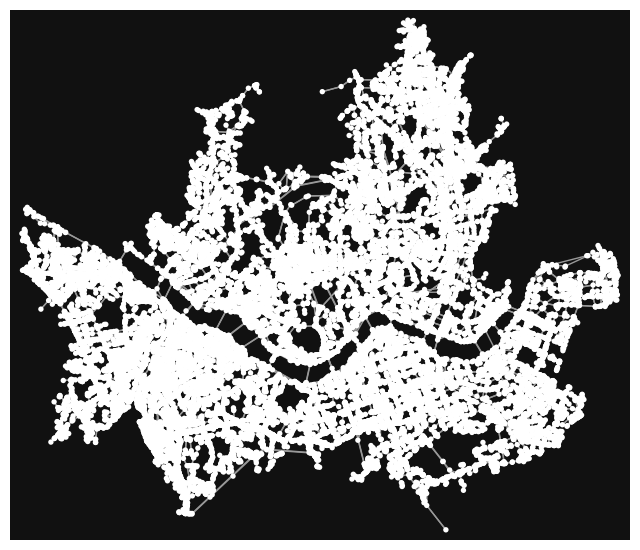

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [86]:
# 네트워크 데이터에 통행 속도 정보를 할당하는 함수 정의

def assign_traffic_speed_data_to_network(_network, _speed_hour_df):

    _network_with_travel_time = _network.copy()

    for u, v, k, data in tqdm(_network_with_travel_time.edges(data=True, keys=True)):
        # Get speed from the hourly traffic speed data
        if data['osmid'] in _speed_hour_df['link_id'].unique():
            data['speed_kmh'] = _speed_hour_df.loc[_speed_hour_df['link_id'] == data['osmid'], 
                                                   'speed_kmh'].values[0]

        else: # If there is no speed data, use the max speed data
            data['speed_kmh'] = data['max_speed']

        # Manually set speed if there is no speed data
        if int(data['speed_kmh']) == 0:
            if data['road_rank'] == '101': # 고속도로
                data['speed_kmh'] = 100 # km/h
            elif data['road_rank'] == '102': # 도시고속도로
                data['speed_kmh'] = 80 
            # 일반국도, 특별/광역시도, 국가지원지방도, 일반지방도, 시군도
            elif data['road_rank'] in ['103', '104', '105', '106', '107']: 
                data['speed_kmh'] = 60
            elif data['road_rank'] == '108': # 고속도로 연결램프
                data['speed_kmh'] = 40
            else:
                raise ValueError('Unexpected Road Rank')
            
        # Calculate Travel Time per edge in seconds
        data['traffic_time_sec'] = data['length_meter'] / (data['speed_kmh'] * 1000 / 3600) # meter/sec

    return _network_with_travel_time

# 정의된 함수를 활용하여, 통행 속도 데이터를 네트워크 데이터에 할당
H = assign_traffic_speed_data_to_network(G, speed_df)

# 네터워크 모양은 동일함. 단, 각 엣지에 통행 속도 및 통행 시간이 할당되어 있음.
ox.plot_graph(H)

In [87]:
# 네트워크 데이터를 GeoDataFrame으로 변환하여 속성정보 확인
nodes_H, edges_H = ox.graph_to_gdfs(H, nodes=True, edges=True)
edges_H

osmid  max_speed road_name road_rank link_type  \
u      v      key                                                         
226853 223385 0    47874115801         50      청계천로       104         1   
223385 814026 0    47874115401          0        종로       104     32768   
       221672 0    47871384201         50      청계천로       104         1   
849319 848554 0    57176515502          0  테헤란로104길       104     32768   
       341513 0    57176515402          0  테헤란로104길       104     32768   
...                        ...        ...       ...       ...       ...   
201426 202350 0    47761160801         70       경인로       103     32768   
       201403 0    47760554202         70       경인로       103     32768   
       201649 0    47760488001         40     남부순환로       104         8   
201648 201426 0    47760499601         40       경인로       104         8   
       201402 0    47760462202         40     남부순환로       104         8   

                   length_meter  speed_kmh  traffic_time_sec  \
u      v      key                                              
226853 223385 0       77.316115         50          5.566760   
223385 814026 0       37.694827         60          2.261690   
       221672 0       53.179899         50          3.828953   
849319 848554 0       10.667113         60          0.640027   
       341513 0       30.665321         60          1.839919   
...                         ...        ...               ...   
201426 202350 0       79.168220          7         40.715085   
       201403 0       72.013328         40          6.481199   
       201649 0       47.102150         33          5.138416   
201648 201426 0       52.079387         25          7.499432   
       201402 0      138.788025         31         16.117319   

                                                            geometry  
u      v      key                                                     
226853 223385 0    LINESTRING (954147.490 1952329.743, 954070.459...  
223385 814026 0    LINESTRING (954070.459 1952336.369, 954071.421...  
       221672 0    LINESTRING (954070.459 1952336.369, 954017.455...  
849319 848554 0    LINESTRING (961569.939 1945537.889, 961566.084...  
       341513 0    LINESTRING (961569.939 1945537.889, 961581.553...  
...                                                              ...  
201426 202350 0    LINESTRING (942622.003 1944533.504, 942699.242...  
       201403 0    LINESTRING (942622.003 1944533.504, 942550.098...  
       201649 0    LINESTRING (942622.003 1944533.504, 942586.974...  
201648 201426 0    LINESTRING (942607.177 1944489.879, 942622.003...  
       201402 0    LINESTRING (942607.177 1944489.879, 942571.033...  

[64129 rows x 9 columns]

아래의 코드를 활용하여, 두 지점 사이의 최단 이동 시간을 구할 수 있음. 
맨하탄 거리 계산에서는 `length_meter`를 활용하여 거리의 가중치를 주었으나, 최단 이동 시간에서는 `traffic_time_sec`를 활용하여 시간의 가중치를 줌. 

Syntax: 
```python
nx.shortest_path_length(G=`NETWORK`, 
                        source=`NEAREST NODE OF ORIGIN`, 
                        target=`NEAREST NODE OF DESTINATION`, 
                        weight=`가중치를 줄 항목`)
```

Source: https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.shortest_paths.generic.shortest_path_length.html

In [129]:
man_dist = nx.shortest_path_length(G, 회기동_node[0], 삼성서울병원_node[0], weight='length_meter')
print(f"맨하탄 거리: {round(man_dist)} m")

travel_time = nx.shortest_path_length(H, 회기동_node[0], 삼성서울병원_node[0], weight='traffic_time_sec')

# travel_time = nx.shortest_path_length(H, 347649, 847578, weight='traffic_time_sec')
print(f"최단 이동 시간: {round(travel_time)} sec")

맨하탄 거리: 15487 m
최단 이동 시간: 3102 sec


In [132]:
# 최단시간 경로를 보여주기 위한 Geometry를 추출하는 코드. 최단 시간을 계산하기에는 필요하지 않음. 

routes_time = nx.shortest_path(G, 회기동_node[0], 삼성서울병원_node[0], weight='traffic_time_sec')
od_list_time = [[routes_time[i], routes_time[i+1]] for i in range(len(routes_time)-1)]
ori_dest_time = [list(x) for x in zip(*od_list_time)]
routes_time_gdf = gpd.GeoDataFrame(data={'origin': ori_dest_time[0], 'dest': ori_dest_time[1]},
                                   geometry=[edges.loc[(u, v)].geometry.iloc[0] for u, v in od_list_time], 
                                   crs=edges.crs)
routes_time_gdf.head(3)

/var/folders/pz/gjtw38596y3_mm15469h9jy40000gn/T/ipykernel_34686/3955166920.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  geometry=[edges.loc[(u, v)].geometry.iloc[0] for u, v in od_list_time],


,origin,dest,geometry
0,347649,345501,"LINESTRING (960510.889 1955032.770, 960512.291..."
1,345501,563330,"LINESTRING (960512.291 1955004.100, 960496.930..."
2,563330,345500,"LINESTRING (960496.930 1954896.620, 960475.643..."


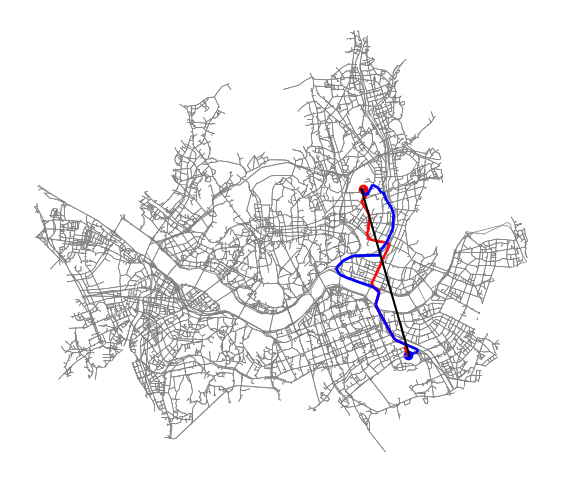

In [134]:
# 유클리디안 거리, 맨하탄 거리 (최단 거리 경로), 최단 시간 경로 비교

# 캔버스 생성
fig, ax = plt.subplots(figsize=(7,7))

# 회기동 중심점 노드
nodes.loc[nodes.index == 회기동_node[0]].plot(ax=ax, color='red')  # Snapping point

# 삼성서울병원 노드
nodes.loc[nodes.index == 삼성서울병원_node[0]].plot(ax=ax, color='blue')  # Snapping point

# Plot the road network
edges.plot(ax=ax, color='grey', linewidth=0.5)
routes_gdf.plot(ax=ax, color='red', linewidth=2) # 최단 거리 경로
routes_time_gdf.plot(ax=ax, color='blue', linewidth=2) # 최단 시간 경로

# Euclidean distance
ax.plot([삼성서울병원.geometry.x, 회기동.geometry.x], [삼성서울병원.geometry.y, 회기동.geometry.y], color='black')
ax.set_axis_off()

plt.show()

---
### *Exercise*

아래의 코드를 활용하여, 여의동에서 경희대학교병원까지의 최단 이동 시간을 계산하고, 결과 값을 `min_travel_time`에 할당하시오.

```python
# # 세부 단계
# # 0.1. 맨하탄 거리를 계산할 지점 불러오기
# 여의동 = emd_pnt.loc[emd_pnt['ADM_NM'] == '여의동'].reset_index(drop=True)
# 경희대학교병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '경희대학교병원'].reset_index(drop=True)


# # 0.2. 서울 도로네트워크 데이터 불러오기
# G = ox.load_graphml(filepath='./data/road_network_5179.graphml', # 파일 경로
#                     edge_dtypes={'length_meter': float, 
#                                  'max_speed': int,
#                                  'road_rank': str
#                                  } # 불러올 속성의 데이터 타입을 지정
#                     )

# # 0.3. 주어진 지점에서 가장 가까운 노드 찾기
# 여의동_node = ox.distance.nearest_nodes(G, 여의동.geometry.x, 여의동.geometry.y)
# 경희대학교병원_node = ox.distance.nearest_nodes(G, 경희대학교병원.geometry.x, 경희대학교병원.geometry.y)


# # 1. 도로 네트워크에 통행 속도 및 소요 시간 할당
# 정의된 함수를 활용하여, 통행 속도 데이터를 네트워크 데이터에 할당
# H = assign_traffic_speed_data_to_network(G, speed_df)

# 2. 최단 경로 계산 (최단 시간)
# min_travel_time = 

print(min_travel_time)
```
---

In [135]:
# Your code here

# # 세부 단계
# # 0.1. 맨하탄 거리를 계산할 지점 불러오기
# 여의동 = emd_pnt.loc[emd_pnt['ADM_NM'] == '여의동'].reset_index(drop=True)
# 경희대학교병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '경희대학교병원'].reset_index(drop=True)


# # 0.2. 서울 도로네트워크 데이터 불러오기
# G = ox.load_graphml(filepath='./data/road_network_5179.graphml', # 파일 경로
#                     edge_dtypes={'length_meter': float, 
#                                  'max_speed': int,
#                                  'road_rank': str
#                                  } # 불러올 속성의 데이터 타입을 지정
#                     )

# # 0.3. 주어진 지점에서 가장 가까운 노드 찾기
# 여의동_node = ox.distance.nearest_nodes(G, 여의동.geometry.x, 여의동.geometry.y)
# 경희대학교병원_node = ox.distance.nearest_nodes(G, 경희대학교병원.geometry.x, 경희대학교병원.geometry.y)


# # 1. 도로 네트워크에 통행 속도 및 소요 시간 할당
# 정의된 함수를 활용하여, 통행 속도 데이터를 네트워크 데이터에 할당
# H = assign_traffic_speed_data_to_network(G, speed_df)

# 2. 최단 경로 계산 (최단 시간)
# min_travel_time = 

print(min_travel_time)

3139.9837849249247

In [161]:
# 정답 확인
# 아래의 코드가 정상적으로 작동하면, Success가 출력됨
assert round(min_travel_time) == 3140

print('Success')

Success


/var/folders/pz/gjtw38596y3_mm15469h9jy40000gn/T/ipykernel_34686/961609173.py:12: PerformanceWarning: indexing past lexsort depth may impact performance.
  geometry=[_edges.loc[(u, v)].geometry.iloc[0] for u, v in _route_node_list],
/var/folders/pz/gjtw38596y3_mm15469h9jy40000gn/T/ipykernel_34686/961609173.py:12: PerformanceWarning: indexing past lexsort depth may impact performance.
  geometry=[_edges.loc[(u, v)].geometry.iloc[0] for u, v in _route_node_list],


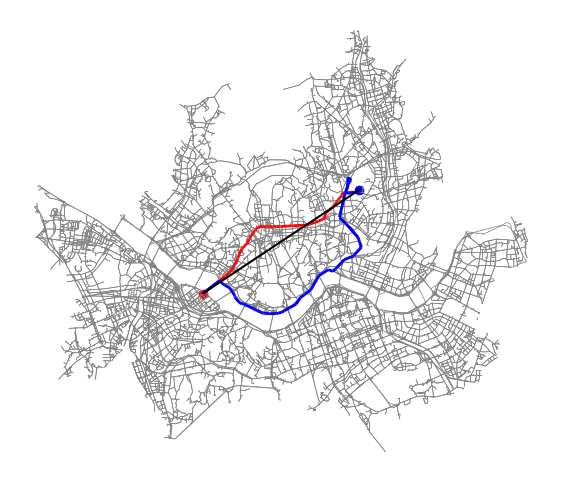

In [171]:
# 이때까지의 Excercise를 통해 계산한 유클리디안 거리, 맨하탄거리, 최단 시간 경로 시각화

def export_route_gdf(_network, _origin_node, _dest_node, _weight):

    _routes = nx.shortest_path(_network, _origin_node, _dest_node, weight=_weight)
    _edges = ox.graph_to_gdfs(_network, nodes=False, edges=True)

    _route_node_list = [[_routes[i], _routes[i+1]] for i in range(len(_routes)-1)]
    _route_node_od = [list(x) for x in zip(*_route_node_list)]
    
    _route_gdf = gpd.GeoDataFrame(data={'origin': _route_node_od[0], 'dest': _route_node_od[1]}, 
                                  geometry=[_edges.loc[(u, v)].geometry.iloc[0] for u, v in _route_node_list], 
                                #   geometry=[edges.loc[(u, v)].geometry.iloc[0] for u, v in od_list_time_exer], 
                                  crs=_edges.crs)
    
    return _route_gdf

# 최단 거리 경로, 최단 시간 경로를 GeoDataFrame으로 변환
exer_route_dist = export_route_gdf(H, 여의동_node[0], 경희대학교병원_node[0], 'length_meter')
exer_route_time = export_route_gdf(H, 여의동_node[0], 경희대학교병원_node[0], 'traffic_time_sec')


# 유클리디안 거리, 맨하탄 거리 (최단 거리 경로), 최단 시간 경로 비교
# 캔버스 생성
fig, ax = plt.subplots(figsize=(7,7))

# 경희대학교병원 위치
nodes.loc[nodes.index == 경희대학교병원_node[0]].plot(ax=ax, color='blue')  # Snapping point

# 여의동 중심점 위치
nodes.loc[nodes.index == 여의동_node[0]].plot(ax=ax, color='red')  # Snapping point

# Plot the road network
edges.plot(ax=ax, color='grey', linewidth=0.5)
exer_route_dist.plot(ax=ax, color='red', linewidth=2) # 최단 거리 경로
exer_route_time.plot(ax=ax, color='blue', linewidth=2) # 최단 시간 경로

# Euclidean distance
ax.plot([여의동.geometry.x, 경희대학교병원.geometry.x], [여의동.geometry.y, 경희대학교병원.geometry.y], color='black')
ax.set_axis_off()

plt.show()

# 3. 여러 지점을 동시에 네트워크 분석하기

NetworkX 패키지에는 최단거리, 최단시간 등의 네트워크 분석을 위한 다양한 함수가 있습니다. <br>
위의 예제에서는 `shortest_path_length` 함수와 `shortest_path` 함수를 활용하여 최단 거리 및 경로를 확인할 수 있었습니다. <br>
Advanced Interface 에는 하나의 병원에 특정 시간동안 접근할 수 있는 지역을 동시에 분석할 수 있는 `single_source_dijkstra_path_length`등이 있습니다. 

Source: https://networkx.org/documentation/stable/reference/algorithms/shortest_paths.html

## 3.1. 경희대학교병원에서 10분 내에 접근할 수 있는 노드 계산하기

In [184]:
경희대학교병원_node = ox.distance.nearest_nodes(H, 경희대학교병원.geometry.x, 경희대학교병원.geometry.y)
경희대학교병원_node

[647525]

In [194]:
# 리턴 값은 Dict keyed by node to shortest path length from source. 
# 즉, 출발지 노드에서 600초 안에 접근할 수 있는 노드의 ID와 해당 노드까지의 최단 시간을 Dictionary 로 반환함
access_node_dic = nx.single_source_dijkstra_path_length(H, 경희대학교병원_node[0], cutoff=600, weight='traffic_time_sec')
access_node_dic

{647525: 0,
 346288: 8.011775489767231,
 346289: 10.742850664588161,
 346346: 65.68609742652052,
 346347: 67.16919508310869,
 647888: 72.56373945885974,
 647889: 76.14133046349924,
 647887: 78.78362665867974,
 345500: 82.66185662776222,
 345949: 95.46200927972068,
 345950: 103.91238273142164,
 563330: 109.39226866987747,
 345703: 121.22214163656463,
 345501: 125.70608907067648,
 347057: 128.8843492288533,
 347649: 135.10012285610318,
 347650: 140.61076793544115,
 345517: 142.7976930463603,
 346684: 145.23730649723868,
 347648: 145.48023816053166,
 347647: 146.56913610546906,
 345704: 147.3650897438933,
 348387: 147.42449897405098,
 347652: 148.5748855327308,
 345702: 149.67182924379676,
 346682: 151.94621205912134,
 346683: 153.4982417020802,
 348448: 162.57931591898986,
 347056: 164.13667218360743,
 346866: 184.2768882673805,
 346867: 192.66137862473963,
 345558: 194.73382765830266,
 347081: 203.63325969682188,
 346360: 205.72575495516458,
 347080: 205.74816306229133,
 347078: 226.468

In [195]:
# Get the keys of the dictionary from access_node_dic
# 즉, 주어진 시간에 접근할 수 있는 노드의 ID만 계산
access_node_dic.keys()

dict_keys([647525, 346288, 346289, 346346, 346347, 647888, 647889, 647887, 345500, 345949, 345950, 563330, 345703, 345501, 347057, 347649, 347650, 345517, 346684, 347648, 347647, 345704, 348387, 347652, 345702, 346682, 346683, 348448, 347056, 346866, 346867, 345558, 347081, 346360, 347080, 347078, 347079, 345555, 345503, 345513, 346284, 347757, 347758, 345496, 345554, 348138, 346686, 347082, 347083, 342304, 347982, 346382, 345954, 346687, 347974, 347975, 345510, 346690, 647526, 345709, 346294, 347747, 346831, 345758, 345508, 348412, 347060, 346293, 346832, 346292, 345435, 614139, 348016, 346694, 345507, 345493, 345817, 345492, 347752, 647527, 348018, 647528, 348322, 348069, 345495, 348321, 647883, 345498, 345947, 348017, 342790, 346257, 342310, 346692, 347800, 588091, 347754, 344832, 347744, 647916, 346286, 348078, 347753, 346688, 346691, 345509, 347059, 563331, 348014, 347058, 347929, 348080, 347061, 346685, 348133, 347746, 348081, 348132, 345514, 348015, 563460, 347953, 340872, 34831

In [196]:
# Check whether the nodes are in the keys of the dictionary
# 전체 노드에서 접근 가능한 노드만 추출
nodes.index.isin(list(access_node_dic.keys()))

array([False, False, False, ..., False, False, False])

In [197]:
# Select the nodes that are within 600 seconds from the source node
# 접근 가능한 노드만 추출
access_node_gdf = nodes.loc[nodes.index.isin(list(access_node_dic.keys()))]
access_node_gdf

,node_type,y,x,lon,lat,geometry
osmid,,,,,,
348056,101,1.955698e+06,959407.565294,127.040147,37.599804,POINT (959407.565 1955698.357)
348343,101,1.955802e+06,959477.584142,127.040934,37.600740,POINT (959477.584 1955801.816)
348317,101,1.955778e+06,959475.990797,127.040917,37.600528,POINT (959475.991 1955778.316)
647916,104,1.954742e+06,958785.309911,127.033151,37.591153,POINT (958785.310 1954741.586)
347744,101,1.954760e+06,958768.655708,127.032962,37.591318,POINT (958768.656 1954759.991)
...,...,...,...,...,...,...
340728,101,1.953802e+06,958464.070630,127.029566,37.582672,POINT (958464.071 1953802.283)
340717,101,1.953778e+06,958434.553978,127.029233,37.582452,POINT (958434.554 1953778.011)
340714,101,1.953841e+06,958461.118098,127.029530,37.583018,POINT (958461.118 1953840.629)


<Axes: >

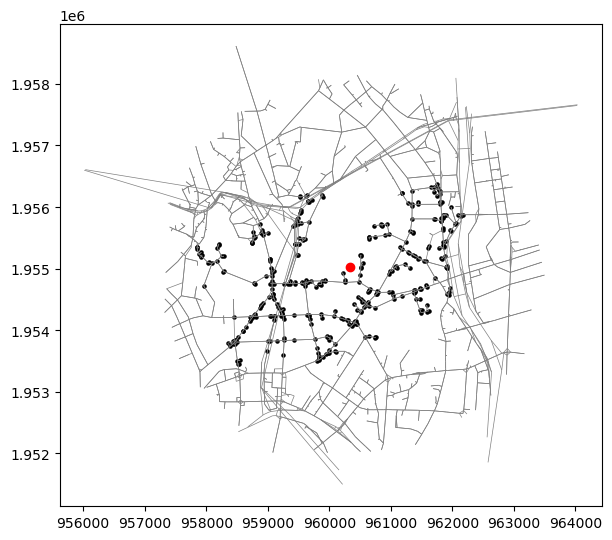

In [199]:
fig, ax = plt.subplots(figsize=(7,7))

ax.plot(경희대학교병원.geometry.x, 경희대학교병원.geometry.y, c='red', marker='o')  # 경희대학교 병원
access_node_gdf.plot(ax=ax, color='black', markersize=5)  # Nodes within 600 secons from the source node

# The below is just for plotting purposes
_temp_buffer = 경희대학교병원.buffer(3000)
edges.loc[edges.intersects(_temp_buffer[0])].plot(ax=ax, color='grey', linewidth=0.5)  

In [ ]:
# 정리된 코드는 아래와 같음. 

# 1. 경희대학교병원 노드 찾기
경희대학교병원_node = ox.distance.nearest_nodes(H, 경희대학교병원.geometry.x, 경희대학교병원.geometry.y)

# 2. 600초 이내에 접근 가능한 노드 찾기 {노드명: 거리/시간}의 딕셔너리로 리턴됨. 
access_node_dic = nx.single_source_dijkstra_path_length(H, 경희대학교병원_node[0], cutoff=600, weight='traffic_time_sec')

# 3. 딕셔너리에서 노드ID 만 추출하여, Node의 Geometry와 결합
# 즉, 주어진 시간에 접근할 수 있는 노드의 Geometry만 추출
access_node_gdf = nodes.loc[nodes.index.isin(list(access_node_dic.keys()))]


---
### *Exercise*

아래의 단계를 활용하여, 서울대학교병원에서 20분 내에 접근할 수 있는 노드를 계산하시오. 

```python
## 세부 단계
# 1. 서울대학교병원 노드 찾기 (서울대학교병원_node로 변수 저장)
## (Optional) 서울대학교 병원의 X, Y 좌표를 우선 GeoDataFrame으로 만든 후 노드를 찾는 것도 가능
서울대학교병원_node = 

# 2. 20분 이내에 접근 가능한 노드의 딕셔너리 ({노드명: 거리/시간})를 `서울대학교병원_node_dic`으로 저장. 
서울대학교병원_node_dic = 

# 3. 접근가능한 노드의 Geometry 추출후, `서울대학교병원_node_gdf`로 저장. 
# 즉, `서울대학교병원_node_dic` 딕셔너리를 이용하여, `nodes` GeoDataFrame의 geometry 추출
서울대학교병원_node_gdf = 

```
---

In [ ]:
## Your code here
# 1. 서울대학교병원 노드 찾기 (서울대학교병원_node로 변수 저장)
## (Optional) 서울대학교 병원의 X, Y 좌표를 우선 GeoDataFrame으로 만든 후 노드를 찾는 것도 가능
서울대학교병원_node = 

# 2. 20분 이내에 접근 가능한 노드의 딕셔너리 ({노드명: 거리/시간})를 `서울대학교병원_node_dic`으로 저장. 
# 실제 이동 시간을 고려할 것이기 때문에, 도로네트워크로 `H` 변수를 활용하여야 함. 
서울대학교병원_node_dic = 

# 3. 접근가능한 노드의 Geometry 추출후, `서울대학병원_node_gdf`로 저장. 
# 즉, `서울대학교병원_node_dic` 딕셔너리를 이용하여, `nodes` GeoDataFrame의 geometry 추출
서울대학병원_node_gdf = 



In [243]:
# 서울대학교병원 = hospitals_5179.loc[hospitals_5179['병원명'] == '서울대학교병원'].reset_index(drop=True)
# 서울대학교병원_node = ox.distance.nearest_nodes(H, 서울대학교병원.geometry.x, 서울대학교병원.geometry.y)

# 서울대학교병원_node_dic = nx.single_source_dijkstra_path_length(H, 서울대학교병원_node[0], cutoff=1200, weight='traffic_time_sec')

# 서울대학교병원_node_gdf = nodes.loc[nodes.index.isin(list(서울대학교병원_node_dic.keys()))]

# # 4. 접근할 수 있는 노드의 Geometry를 모두 포함하는 Convex Hull 생성
# 서울대학병원_convex_hull = gpd.GeoDataFrame({'geometry': [서울대학병원_node_gdf.unary_union.convex_hull]}, crs=서울대학병원_node_gdf.crs)

In [245]:
# 정답 확인
# 아래의 코드가 정상적으로 작동하면, Success가 출력됨
assert 서울대학교병원_node == 224912 or 서울대학교병원_node == [224912]
assert round(서울대학교병원_node_dic[587957]) == 77
assert 서울대학교병원_node_gdf.shape[0] == 1717

print('Success')

Success


## 3.2. Convex Hull을 이용하여 서울대학교병원에서 20분 이내에 접근 가능한 지역 시각화하기

세부단계:

* 접근가능한 모든 노드를 포함하는 Convex Hull을 계산
* Convex Hull과 중첩이 되는 행정동을 추출

DataFrame의 .loc 처럼 GeoDataFrame도 .loc을 활용하여 특정 지역을 선택할 수 있습니다. <br>
세부적으로 활용할 수 있는 Spatial Operation은 아래와 같습니다. <br>

Spatial operations methods in GeoPandas: <br>
- `intersects` method: Selects all rows that intersect a single geometry. <br>
- `within` method: Selects all rows that are within a single geometry. <br>
- `disjoint` method: Selects all rows that are disjoint to a single geometry. <br>

Syntax:
```python
`GEOMETRY COLUMN`.intersects(`A SINGLE GEOMETRY`) # intersect operation (can be replaced with within or disjoint)
```

Spatial operations in GeoPandas can be performed using the `loc` method. The loc method syntax is `df.loc[row condition, column condition]`. The following codes is the completed code to select a given geodataframe based on a spatial operation.<br>

Syntax:
```python
`SELECTED_GDF` = `GEODATAFRAME`.loc[`GEODATAFRAME_A`['geometry'].intersects(`A SINGLE GEOMETRY`)] # Intersects operation
```

Kinds of spatial operations: <br>
![](https://www.researchgate.net/profile/Tran-Dang-2/publication/286609202/figure/fig2/AS:925090808086531@1597570244506/Eight-OGC-spatial-relations-used-in-GeoXACML_W640.jpg)

In [ ]:
# GeoDataFrame of accessible nodes
access_node_gdf

,node_type,y,x,lon,lat,geometry
osmid,,,,,,
348056,101,1.955698e+06,959407.565294,127.040147,37.599804,POINT (959407.565 1955698.357)
348343,101,1.955802e+06,959477.584142,127.040934,37.600740,POINT (959477.584 1955801.816)
348317,101,1.955778e+06,959475.990797,127.040917,37.600528,POINT (959475.991 1955778.316)
647916,104,1.954742e+06,958785.309911,127.033151,37.591153,POINT (958785.310 1954741.586)
347744,101,1.954760e+06,958768.655708,127.032962,37.591318,POINT (958768.656 1954759.991)
...,...,...,...,...,...,...
340728,101,1.953802e+06,958464.070630,127.029566,37.582672,POINT (958464.071 1953802.283)
340717,101,1.953778e+06,958434.553978,127.029233,37.582452,POINT (958434.554 1953778.011)
340714,101,1.953841e+06,958461.118098,127.029530,37.583018,POINT (958461.118 1953840.629)


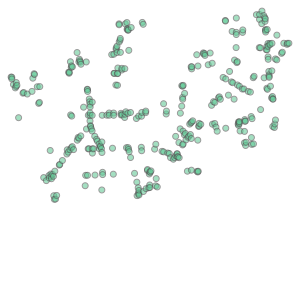

In [ ]:
# Dissove the GeoDataFrame to create a single geometry
# ArcGIS의 Dissolve와 유사한 기능
access_node_gdf.unary_union

In [ ]:
# In the form of well-known text (WKT)
access_node_gdf.unary_union.wkt

'MULTIPOINT ((957842.3320623728 1955349.1070412397), (957853.0921146862 1955346.4776486498), (957853.3616915806 1955319.238988736), (957878.5009249825 1955232.4665742025), (957907.7665369945 1955180.4534289911), (957920.516750076 1955203.075420861), (957922.3211551945 1955263.3130970723), (957932.5437927786 1955220.6953914869), (957958.8997163769 1954716.456238958), (958027.0032449962 1955098.3040879266), (958037.7252122444 1955108.7322424091), (958093.5186124699 1955084.9747046132), (958167.3667622108 1955126.164451243), (958180.6139247814 1955331.7226087798), (958199.8341268164 1955400.7371160856), (958205.4903720487 1955388.5840750558), (958249.3616299926 1955198.011334719), (958271.2570592735 1954939.6589870085), (958282.5513210243 1954954.0887280563), (958288.2719528982 1955200.4671043355), (958349.3915761093 1953784.9933600202), (958389.9097512212 1953737.6007114877), (958430.073780701 1953815.785575756), (958434.5539781036 1953778.0105819274), (958450.5528360449 1954206.75234650

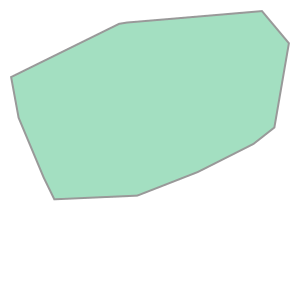

In [ ]:
# How to create a convex hull from the GeoDataFrame
access_node_gdf.unary_union.convex_hull

In [ ]:
# Convex hull needs to be converted into a GeoDataFrame to be plotted. 
convex_hull_gdf = gpd.GeoDataFrame({'geometry': [access_node_gdf.unary_union.convex_hull]}, 
                                   crs=access_node_gdf.crs)
convex_hull_gdf

,geometry
0,"POLYGON ((958514.657 1953446.994, 958349.392 1..."


<Axes: >

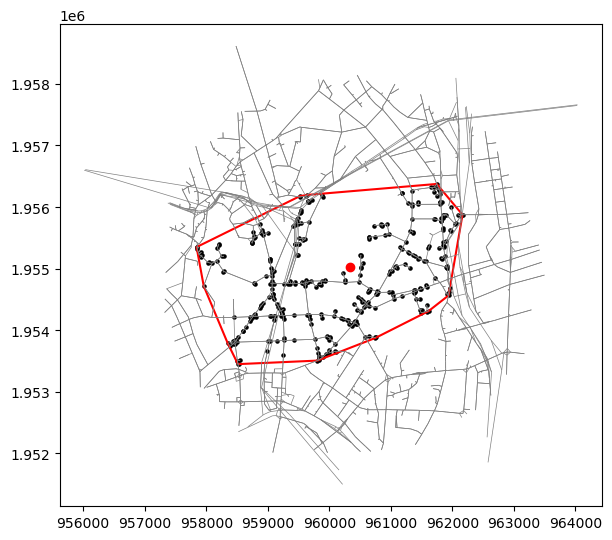

In [ ]:
fig, ax = plt.subplots(figsize=(7,7))

ax.plot(경희대학교병원.geometry.x, 경희대학교병원.geometry.y, c='red', marker='o')  # 경희대학교 병원
access_node_gdf.plot(ax=ax, color='black', markersize=5)  # Nodes within 600 secons from the source node
convex_hull_gdf.boundary.plot(ax=ax, color='red')  # Convex hull

# The below is just for plotting purposes
_temp_buffer = 경희대학교병원.buffer(3000)
edges.loc[edges.intersects(_temp_buffer[0])].plot(ax=ax, color='grey', linewidth=0.5)  

Convex Hull과 중첩되는 행정동 추출

In [253]:
# 접근 가능한 노드를 모두 포함하는 Convex Hull
access_convex_hull = access_node_gdf.unary_union.convex_hull
access_convex_hull

In [227]:
# 행정동 GeoDataFrame
emd

,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,사직동,11010530,"POLYGON ((953553.932 1953335.741, 953555.211 1..."
1,20230701,삼청동,11010540,"POLYGON ((954025.242 1953916.389, 954026.972 1..."
2,20230701,부암동,11010550,"POLYGON ((952490.380 1956548.821, 952497.594 1..."
3,20230701,평창동,11010560,"POLYGON ((953683.828 1959209.871, 953665.283 1..."
4,20230701,한남동,11030740,"POLYGON ((956238.296 1950166.610, 956237.942 1..."
...,...,...,...,...
421,20230701,가회동,11010600,"POLYGON ((954894.795 1954614.580, 954888.290 1..."
422,20230701,종로1·2·3·4가동,11010610,"POLYGON ((954918.389 1954371.538, 954926.411 1..."
423,20230701,방배2동,11220630,"POLYGON ((954967.724 1942969.970, 954985.115 1..."
424,20230701,미아동,11090700,"POLYGON ((958301.054 1959603.612, 958292.609 1..."


In [254]:
# 중첩 되는지 여부를 테스트
emd['geometry'].intersects(access_convex_hull)

0      False
1      False
2      False
3      False
4      False
       ...  
421    False
422    False
423    False
424    False
425    False
Length: 426, dtype: bool

In [255]:
# .loc 을 활용하여 중첩되는 행만 추출
emd.loc[emd['geometry'].intersects(access_convex_hull)]

,BASE_DATE,ADM_NM,ADM_CD,geometry
29,20230701,동선동,11080830,"POLYGON ((957190.502 1955515.141, 957194.000 1..."
30,20230701,휘경1동,11060720,"POLYGON ((961617.970 1955195.988, 961617.291 1..."
31,20230701,이문1동,11060890,"POLYGON ((961335.446 1955739.362, 961431.504 1..."
32,20230701,이문2동,11060900,"POLYGON ((961991.849 1956626.223, 961991.849 1..."
37,20230701,월곡2동,11080720,"POLYGON ((959967.513 1956991.922, 959968.619 1..."
186,20230701,회기동,11060710,"POLYGON ((960540.208 1955635.067, 960542.330 1..."
187,20230701,휘경2동,11060730,"POLYGON ((962179.971 1954375.052, 962193.343 1..."
188,20230701,청량리동,11060800,"POLYGON ((959658.757 1955382.029, 959719.904 1..."
189,20230701,용신동,11060810,"POLYGON ((958473.558 1953657.637, 958479.473 1..."
190,20230701,제기동,11060820,"POLYGON ((959341.124 1954751.028, 959384.958 1..."


In [231]:
# 접근 가능한 행정동
access_emd = emd.loc[emd['geometry'].intersects(access_node_gdf.unary_union.convex_hull)].reset_index(drop=True)

# 접근 불가능한 행정동 (~ 연산자 활용)
non_access_emd = emd.loc[~emd['geometry'].intersects(access_node_gdf.unary_union.convex_hull)].reset_index(drop=True)

<Axes: >

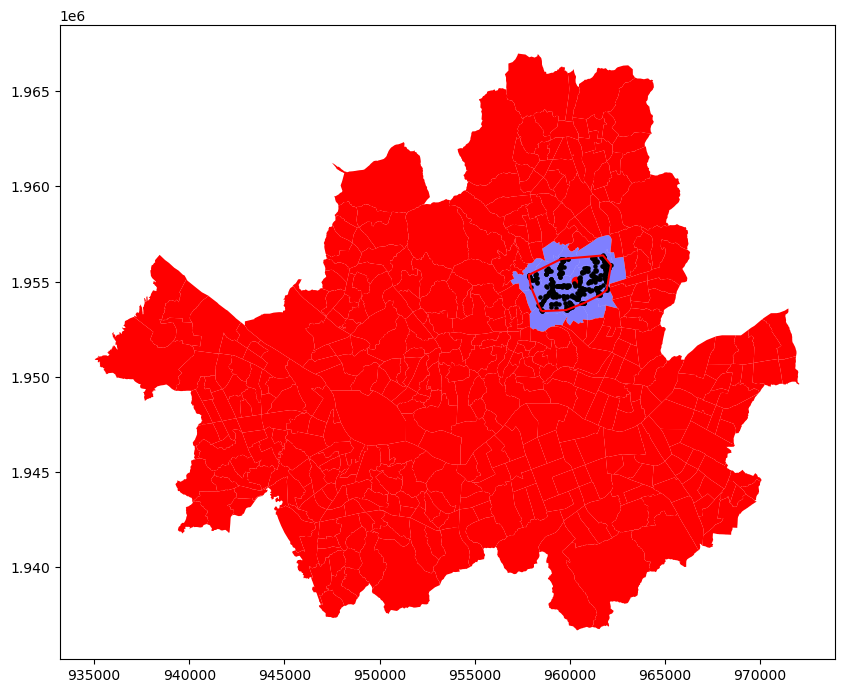

In [238]:
fig, ax = plt.subplots(figsize=(10, 10))

ax.plot(경희대학교병원.geometry.x, 경희대학교병원.geometry.y, c='red', marker='o')  # 경희대학교 병원
access_node_gdf.plot(ax=ax, color='black', markersize=5, zorder=2)  # Nodes within 600 secons from the source node
convex_hull_gdf.boundary.plot(ax=ax, color='red')  # Convex hull

# 접근 가능한 행정동
access_emd.plot(ax=ax, color='blue', alpha=0.5, zorder=1)

# 접근 불가능한 행정동
non_access_emd.plot(ax=ax, color='red', linewidth=0.5)

In [ ]:
# 정리된 코드는 아래와 같음. 

# 1. 경희대학교병원 노드 찾기
경희대학교병원_node = ox.distance.nearest_nodes(H, 경희대학교병원.geometry.x, 경희대학교병원.geometry.y)

# 2. 600초 이내에 접근 가능한 노드 찾기 {노드명: 거리/시간}의 딕셔너리로 리턴됨. 
access_node_dic = nx.single_source_dijkstra_path_length(H, 경희대학교병원_node[0], cutoff=600, weight='traffic_time_sec')

# 3. 딕셔너리에서 노드ID 만 추출하여, Node의 Geometry와 결합
# 즉, 주어진 시간에 접근할 수 있는 노드의 Geometry만 추출
access_node_gdf = nodes.loc[nodes.index.isin(list(access_node_dic.keys()))]

# 4. 접근할 수 있는 노드의 Geometry를 모두 포함하는 Convex Hull 생성
convex_hull = access_node_gdf.unary_union.convex_hull

# 5. 접근 가능한 행정동 추출
access_emd = emd.loc[emd['geometry'].intersects(convex_hull)].reset_index(drop=True)

# 6. 접근 불가능한 행정동 (~ 연산자 활용)
non_access_emd = emd.loc[~emd['geometry'].intersects(access_node_gdf.unary_union.convex_hull)].reset_index(drop=True)

---
### *Exercise*

아래의 단계를 활용하여, 서울대학교병원에서 20분 내에 접근할 수 있는 행정동을 계산하시오. 

```python
## 세부 단계
# 4. `서울대학교병원_node_gdf`의 포인트를 모두 포함하는 Convex Hull를 GeoDataFrame에 넣은 후, `서울대학교병원_convex_hull`로 저장
서울대학교병원_convex_hull = 

# 5. Convex Hull과 중첩되는 행정동(emd)을 추출하여, `서울대학교병원_접근가능`으로 저장
서울대학교병원_접근가능 = 
```
---

In [259]:
# 정답 확인
# 아래의 코드가 정상적으로 작동하면, Success가 출력됨
assert round(서울대학교병원_convex_hull.area) == 31327840
assert 서울대학교병원_접근가능.shape[0] == 50

print('Success')

Success


In [258]:
# 서울대학교병원_convex_hull = 서울대학교병원_node_gdf.unary_union.convex_hull
# 서울대학교병원_접근가능 = emd.loc[emd['geometry'].intersects(서울대학교병원_convex_hull.unary_union)].reset_index(drop=True)
# 서울대학교병원_접근가능.explore()

## 3.3. Function을 사용하여 모든 병원에서 10분내에 접근 가능한 지역 추출하기

In [275]:
# Summary

def calculate_emd_within_travel_time(_network, _cut_off, _origin_gdf, _emd):

    # 0. 도로네트워크 데이터에서 노드 및 엣지 추출
    _nodes= ox.graph_to_gdfs(_network, nodes=True, edges=False)
    
    # 1. 최근린 노드 찾기
    _origin_nearest_node = ox.distance.nearest_nodes(_network, _origin_gdf.geometry.x, _origin_gdf.geometry.y) # OSMID nearest to stadium

    # 2. 특정시간 (cutoff) 이내에 접근 가능한 노드 찾기
    _access_node_dic = nx.single_source_dijkstra_path_length(_network, _origin_nearest_node[0], cutoff=_cut_off, weight='traffic_time_sec')

    # 3. 접근 가능한 노드의 Geometry 추출
    _access_node_gdf = _nodes.loc[_nodes.index.isin(list(_access_node_dic.keys()))]

    # 접근할 수 있는 노드의 Geometry를 모두 포함하는 Convex Hull 생성
    _access_convex_hull = _access_node_gdf.unary_union.convex_hull

    # Convex Hull과 겹치는 행정동 추출
    _emd_within = _emd.loc[_emd.intersects(_access_convex_hull)].reset_index(drop=True)

    return _emd_within

In [280]:
# 결과 값이 추가될 빈 GeoDataFrame 생성
access_emd_all = gpd.GeoDataFrame()

# 모든 병원 데이터에 대하여 Iteration 수행
for idx, row in hospitals_5179.iterrows():

    # 각 병원을 별도의 GeoDataFrame으로 추출
    _temp_hospitals = hospitals_5179.loc[hospitals_5179['병원명'] == row['병원명']].reset_index(drop=True)

    # 병원별 접근 가능한 행정동 추출
    _emd_intersect = calculate_emd_within_travel_time(_network=H, 
                                                      _cut_off=600, 
                                                      _origin_gdf=_temp_hospitals, 
                                                      _emd=emd)
    print(f"병원명: {row['병원명']} | 접근 가능한 행정동 수: {_emd_intersect.shape[0]}")

    # 각 병원에서 접근 가능한 행정동을 하나의 GeoDataFrame으로 병합
    access_emd_all = pd.concat([access_emd_all, _emd_intersect], ignore_index=True)
    
access_emd_all.head(3)

병원명: 연세대학교의과대학세브란스병원 | 접근 가능한 행정동 수: 29
병원명: 강북삼성병원 | 접근 가능한 행정동 수: 25
병원명: 이화여자대학교의과대학부속목동병원 | 접근 가능한 행정동 수: 27
병원명: 중앙대학교병원 | 접근 가능한 행정동 수: 27
병원명: 서울대학교병원 | 접근 가능한 행정동 수: 16
병원명: 학교법인가톨릭학원가톨릭대학교서울성모병원 | 접근 가능한 행정동 수: 13
병원명: 학교법인 고려중앙학원 고려대학교의과대학부속병원(안암병원) | 접근 가능한 행정동 수: 23
병원명: 고려대학교의과대학부속구로병원 | 접근 가능한 행정동 수: 19
병원명: 한양대학교병원 | 접근 가능한 행정동 수: 23
병원명: 경희대학교병원 | 접근 가능한 행정동 수: 18
병원명: 연세대학교의과대학 강남세브란스병원 | 접근 가능한 행정동 수: 13
병원명: 건국대학교병원 | 접근 가능한 행정동 수: 5
병원명: 삼성서울병원 | 접근 가능한 행정동 수: 19
병원명: 재단법인아산사회복지재단 서울아산병원 | 접근 가능한 행정동 수: 17


,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,사직동,11010530,"POLYGON ((953553.932 1953335.741, 953555.211 1..."
1,20230701,중림동,11020680,"POLYGON ((953192.344 1951533.864, 953194.865 1..."
2,20230701,무악동,11010570,"POLYGON ((952298.144 1953539.606, 952324.838 1..."


In [279]:
access_emd_all.explore()

In [288]:
access_emd_all

,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,사직동,11010530,"POLYGON ((953553.932 1953335.741, 953555.211 1..."
1,20230701,중림동,11020680,"POLYGON ((953192.344 1951533.864, 953194.865 1..."
2,20230701,무악동,11010570,"POLYGON ((952298.144 1953539.606, 952324.838 1..."
3,20230701,천연동,11130520,"POLYGON ((951869.539 1953225.131, 951868.579 1..."
4,20230701,홍은2동,11130680,"POLYGON ((950470.907 1955410.863, 950476.018 1..."
...,...,...,...,...
269,20230701,암사2동,11250580,"POLYGON ((967594.483 1951550.050, 967608.624 1..."
270,20230701,천호3동,11250630,"POLYGON ((967012.256 1948788.331, 967090.546 1..."
271,20230701,성내2동,11250660,"POLYGON ((966822.130 1948873.977, 966823.557 1..."
272,20230701,성내3동,11250670,"POLYGON ((967650.379 1946978.998, 967646.790 1..."


In [301]:
# Pandas의 Groupby와 Aggregation을 활용하여, 행정동별로 접근 가능한 병원 수를 계산
unique_access_emd = access_emd_all.groupby('ADM_NM').agg(ADM_CD=('ADM_CD','first'),
                                                         count=('ADM_CD','count')).reset_index()
unique_access_emd

,ADM_NM,ADM_CD,count
0,가락1동,11240660,1
1,가락본동,11240650,1
2,가리봉동,11170700,1
3,가산동,11180510,1
4,가회동,11010600,1
...,...,...,...
209,회기동,11060710,1
210,회현동,11020540,1
211,휘경1동,11060720,1
212,휘경2동,11060730,1


In [304]:
# Geometry를 얻기 위하여, 행정동 GeoDataFrame과 Join
access_emd_count = emd.merge(unique_access_emd, on='ADM_CD')
access_emd_count

,BASE_DATE,ADM_NM_x,ADM_CD,geometry,ADM_NM_y,count
0,20230701,사직동,11010530,"POLYGON ((953553.932 1953335.741, 953555.211 1...",사직동,2
1,20230701,삼청동,11010540,"POLYGON ((954025.242 1953916.389, 954026.972 1...",삼청동,2
2,20230701,부암동,11010550,"POLYGON ((952490.380 1956548.821, 952497.594 1...",부암동,1
3,20230701,왕십리2동,11040520,"POLYGON ((958262.940 1951830.159, 958266.662 1...",왕십리2동,1
4,20230701,마장동,11040540,"POLYGON ((959182.984 1952644.101, 959192.863 1...",마장동,1
...,...,...,...,...,...,...
209,20230701,성내3동,11250670,"POLYGON ((967650.379 1946978.998, 967646.790 1...",성내3동,1
210,20230701,천호2동,11250730,"POLYGON ((966110.271 1950148.101, 966118.161 1...",천호2동,1
211,20230701,교남동,11010580,"POLYGON ((952572.048 1953258.829, 952573.174 1...",교남동,2
212,20230701,가회동,11010600,"POLYGON ((954894.795 1954614.580, 954888.290 1...",가회동,1


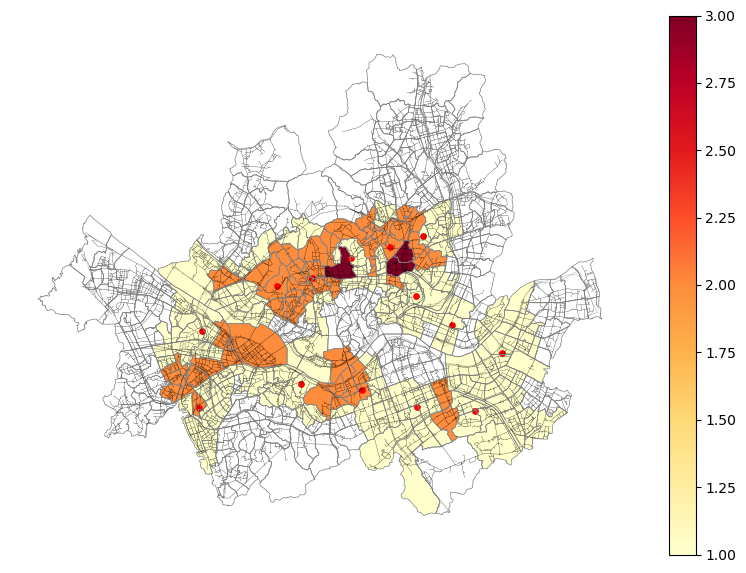

In [319]:
# 유클리디안 거리, 맨하탄 거리 (최단 거리 경로), 최단 시간 경로 비교
# 캔버스 생성
fig, ax = plt.subplots(figsize=(10,7))

# 각 행정동에서 10분 내에 접근 가능한 병원의 수
access_emd_count.plot(column='count', cmap='YlOrRd', legend=True, ax=ax)

# 병원의 위치
hospitals_5179.plot(ax=ax, color='red', markersize=15)

# Plot the road network
edges.plot(ax=ax, color='black', linewidth=0.1, zorder=1)
emd.boundary.plot(ax=ax, color='grey', linewidth=0.5)

ax.set_axis_off()

plt.show()
